In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [7]:
data=pd.read_csv(r"C:\Users\Abhijit Kharade\Downloads\Flipkart.csv")
data

,review,rating
0,It was nice produt. I like it's design a lot. ...,5
1,awesome sound....very pretty to see this nd th...,5
2,awesome sound quality. pros 7-8 hrs of battery...,4
3,I think it is such a good product not only as ...,5
4,awesome bass sound quality very good bettary l...,5
...,...,...
9971,GoodREAD MORE,5
9972,Everything is amazimg but the built is very li...,5
9973,GoodREAD MORE,5
9974,Best headphone i have ever used....READ MORE,5


# Text Preprocessing

In [8]:
data=[review.strip() for review in data.review] # remove both the leading and the trailing characters
data=[review for review in data if review] # removes empty strings, because they are considered in Python as False
data[0:10]

["It was nice produt. I like it's design a lot.  It's easy to carry. And.   Looked stylish.READ MORE",
 'awesome sound....very pretty to see this nd the sound quality was too good I wish to take this product loved this product 😍😍😍READ MORE',
 'awesome sound quality. pros 7-8 hrs of battery life (including 45 mins approx call time)Awesome sound output. Bass and treble are really very clear without equaliser. With equaliser, sound wary depends on the handset sound quality.Weightless to carry and in head tooMic is good, but in traffic it is not too good (3.25/5)3.5mm Option is really important to mention. Really expecting other leading brands to implement this.ConsVery tight in ears. adjusters are ok .. this ll be very tight...READ MORE',
 'I think it is such a good product not only as per the quality but also the design is quite good . I m using this product from January ... In this pandamic situation it has became the most useful and helpful . Overall the bass and the sound quality is p

In [ ]:
# Joining the list into one string/text

In [9]:
reviews_text=' '.join(data)
reviews_text

'It was nice produt. I like it\'s design a lot.  It\'s easy to carry. And.   Looked stylish.READ MORE awesome sound....very pretty to see this nd the sound quality was too good I wish to take this product loved this product 😍😍😍READ MORE awesome sound quality. pros 7-8 hrs of battery life (including 45 mins approx call time)Awesome sound output. Bass and treble are really very clear without equaliser. With equaliser, sound wary depends on the handset sound quality.Weightless to carry and in head tooMic is good, but in traffic it is not too good (3.25/5)3.5mm Option is really important to mention. Really expecting other leading brands to implement this.ConsVery tight in ears. adjusters are ok .. this ll be very tight...READ MORE I think it is such a good product not only as per the quality but also the design is quite good . I m using this product from January ... In this pandamic situation it has became the most useful and helpful . Overall the bass and the sound quality is pretty good 

In [ ]:
# Remove Punctuations 

In [10]:
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'It was nice produt I like its design a lot  Its easy to carry And   Looked stylishREAD MORE awesome soundvery pretty to see this nd the sound quality was too good I wish to take this product loved this product 😍😍😍READ MORE awesome sound quality pros 78 hrs of battery life including 45 mins approx call timeAwesome sound output Bass and treble are really very clear without equaliser With equaliser sound wary depends on the handset sound qualityWeightless to carry and in head tooMic is good but in traffic it is not too good 325535mm Option is really important to mention Really expecting other leading brands to implement thisConsVery tight in ears adjusters are ok  this ll be very tightREAD MORE I think it is such a good product not only as per the quality but also the design is quite good  I m using this product from January  In this pandamic situation it has became the most useful and helpful  Overall the bass and the sound quality is pretty good and another thing that will give you suc

# Tokenization

In [11]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\Abhijit
[nltk_data]     Kharade\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Abhijit
[nltk_data]     Kharade\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['It', 'was', 'nice', 'produt', 'I', 'like', 'its', 'design', 'a', 'lot', 'Its', 'easy', 'to', 'carry', 'And', 'Looked', 'stylishREAD', 'MORE', 'awesome', 'soundvery', 'pretty', 'to', 'see', 'this', 'nd', 'the', 'sound', 'quality', 'was', 'too', 'good', 'I', 'wish', 'to', 'take', 'this', 'product', 'loved', 'this', 'product', '😍😍😍READ', 'MORE', 'awesome', 'sound', 'quality', 'pros', '78', 'hrs', 'of', 'battery']


In [13]:
len(text_tokens)

166637

# Remove stopwords

In [14]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['nice', 'produt', 'like', 'design', 'lot', 'Its', 'easy', 'carry', 'And', 'Looked', 'stylishREAD', 'MORE', 'awesome', 'soundvery', 'pretty', 'see', 'nd', 'sound', 'quality', 'good', 'wish', 'take', 'product', 'loved', 'product', '😍😍😍READ', 'MORE', 'awesome', 'sound', 'quality', 'pros', '78', 'hrs', 'battery', 'life', 'including', '45', 'mins', 'approx', 'call', 'timeAwesome', 'sound', 'output', 'Bass', 'treble', 'really', 'clear', 'without', 'equaliser', 'With', 'equaliser', 'sound', 'wary', 'depends', 'handset', 'sound', 'qualityWeightless', 'carry', 'head', 'tooMic', 'good', 'traffic', 'good', '325535mm', 'Option', 'really', 'important', 'mention', 'Really', 'expecting', 'leading', 'brands', 'implement', 'thisConsVery', 'tight', 'ears', 'adjusters', 'ok', 'tightREAD', 'MORE', 'think', 'good', 'product', 'per', 'quality', 'also', 'design', 'quite', 'good', 'using', 'product', 'January', 'In', 'pandamic', 'situation', 'became', 'useful', 'helpful', 'Overall', 'bass', 'sound', 'quality

# Normalize the data

In [15]:
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['nice', 'produt', 'like', 'design', 'lot', 'its', 'easy', 'carry', 'and', 'looked', 'stylishread', 'more', 'awesome', 'soundvery', 'pretty', 'see', 'nd', 'sound', 'quality', 'good', 'wish', 'take', 'product', 'loved', 'product', '😍😍😍read', 'more', 'awesome', 'sound', 'quality', 'pros', '78', 'hrs', 'battery', 'life', 'including', '45', 'mins', 'approx', 'call', 'timeawesome', 'sound', 'output', 'bass', 'treble', 'really', 'clear', 'without', 'equaliser', 'with', 'equaliser', 'sound', 'wary', 'depends', 'handset', 'sound', 'qualityweightless', 'carry', 'head', 'toomic', 'good', 'traffic', 'good', '325535mm', 'option', 'really', 'important', 'mention', 'really', 'expecting', 'leading', 'brands', 'implement', 'thisconsvery', 'tight', 'ears', 'adjusters', 'ok', 'tightread', 'more', 'think', 'good', 'product', 'per', 'quality', 'also', 'design', 'quite', 'good', 'using', 'product', 'january', 'in', 'pandamic', 'situation', 'became', 'useful', 'helpful', 'overall', 'bass', 'sound', 'quality

# Stemming 

In [16]:
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['nice', 'produt', 'like', 'design', 'lot', 'it', 'easi', 'carri', 'and', 'look', 'stylishread', 'more', 'awesom', 'soundveri', 'pretti', 'see', 'nd', 'sound', 'qualiti', 'good', 'wish', 'take', 'product', 'love', 'product', '😍😍😍read', 'more', 'awesom', 'sound', 'qualiti', 'pro', '78', 'hr', 'batteri', 'life', 'includ', '45', 'min', 'approx', 'call', 'timeawesom', 'sound', 'output', 'bass', 'trebl', 'realli', 'clear', 'without', 'equalis', 'with', 'equalis', 'sound', 'wari', 'depend', 'handset', 'sound', 'qualityweightless', 'carri', 'head', 'toomic', 'good', 'traffic', 'good', '325535mm', 'option', 'realli', 'import', 'mention', 'realli', 'expect', 'lead', 'brand', 'implement', 'thisconsveri', 'tight', 'ear', 'adjust', 'ok', 'tightread', 'more', 'think', 'good', 'product', 'per', 'qualiti', 'also', 'design', 'quit', 'good', 'use', 'product', 'januari', 'in', 'pandam', 'situat', 'becam', 'use', 'help', 'overal', 'bass', 'sound', 'qualiti', 'pretti', 'good', 'anoth', 'thing', 'give', 's

# Lemmatization

In [17]:
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

nice produt like design lot its easy carry and looked stylishread more awesome soundvery pretty see nd sound quality good wish take product loved product 😍😍😍read more awesome sound quality pros 78 hrs battery life including 45 mins approx call timeawesome sound output bass treble really clear without equaliser with equaliser sound wary depends handset sound qualityweightless carry head toomic good traffic good 325535mm option really important mention really expecting leading brands implement thisconsvery tight ears adjusters ok tightread more think good product per quality also design quite good using product january in pandamic situation became useful helpful overall bass sound quality pretty good another thing give sigh relief provide wire help case lacking chargesread more awesome bass sound quality good bettary long life purchase rs999 really grateful product dont forget likeread more awsome sound powerful bass battery backup also excellent loved bass im huge lover music bass desig

In [18]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['nice', 'produt', 'like', 'design', 'lot', 'its', 'easy', 'carry', 'and', 'look', 'stylishread', 'more', 'awesome', 'soundvery', 'pretty', 'see', 'nd', 'sound', 'quality', 'good', 'wish', 'take', 'product', 'love', 'product', '😍', '😍', '😍', 'read', 'more', 'awesome', 'sound', 'quality', 'pro', '78', 'hrs', 'battery', 'life', 'include', '45', 'min', 'approx', 'call', 'timeawesome', 'sound', 'output', 'bass', 'treble', 'really', 'clear', 'without', 'equaliser', 'with', 'equalis', 'sound', 'wary', 'depend', 'handset', 'sound', 'qualityweightless', 'carry', 'head', 'toomic', 'good', 'traffic', 'good', '325535', 'mm', 'option', 'really', 'important', 'mention', 'really', 'expect', 'lead', 'brand', 'implement', 'thisconsvery', 'tight', 'ear', 'adjuster', 'ok', 'tightread', 'more', 'think', 'good', 'product', 'per', 'quality', 'also', 'design', 'quite', 'good', 'use', 'product', 'january', 'in', 'pandamic', 'situation', 'become', 'useful', 'helpful', 'overall', 'bass', 'sound', 'quality', 'p

# Clean Reviews

In [19]:
clean_reviews=' '.join(lemmas)
clean_reviews

"nice produt like design lot its easy carry and look stylishread more awesome soundvery pretty see nd sound quality good wish take product love product 😍 😍 😍 read more awesome sound quality pro 78 hrs battery life include 45 min approx call timeawesome sound output bass treble really clear without equaliser with equalis sound wary depend handset sound qualityweightless carry head toomic good traffic good 325535 mm option really important mention really expect lead brand implement thisconsvery tight ear adjuster ok tightread more think good product per quality also design quite good use product january in pandamic situation become useful helpful overall bass sound quality pretty good another thing give sigh relief provide wire help case lack chargesread more awesome bass sound quality good bettary long life purchase rs999 really grateful product do not forget likeread more awsome sound powerful bass battery backup also excellent love bass I m huge lover music bass design build also nice

# Feature Extaction

## Using CountVectorizer

In [20]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)

In [21]:
print(cv.vocabulary_)

{'nice': 5478, 'produt': 6458, 'like': 4800, 'design': 2633, 'lot': 4903, 'its': 4548, 'easy': 2989, 'carry': 1918, 'and': 843, 'look': 4868, 'stylishread': 7690, 'more': 5332, 'awesome': 1045, 'soundvery': 7520, 'pretty': 6248, 'see': 7171, 'nd': 5436, 'sound': 7477, 'quality': 6580, 'good': 3693, 'wish': 8806, 'take': 7858, 'product': 6350, 'love': 4923, 'read': 6771, 'pro': 6313, '78': 499, 'hrs': 4263, 'battery': 1335, 'life': 4777, 'include': 4370, '45': 356, 'min': 5177, 'approx': 894, 'call': 1842, 'timeawesome': 8115, 'output': 5818, 'bass': 1243, 'treble': 8227, 'really': 6782, 'clear': 2060, 'without': 8814, 'equaliser': 3090, 'with': 8809, 'equalis': 3088, 'wary': 8625, 'depend': 2618, 'handset': 3926, 'qualityweightless': 6659, 'head': 3989, 'toomic': 8175, 'traffic': 8212, '325535': 288, 'mm': 5240, 'option': 5747, 'important': 4336, 'mention': 5119, 'expect': 3204, 'lead': 4734, 'brand': 1651, 'implement': 4334, 'thisconsvery': 8005, 'tight': 8087, 'ear': 2902, 'adjuster'

In [22]:
print(cv.get_feature_names()[100:350])

['12hoursmic', '12hr', '12hrs', '12k', '12month', '13', '1300', '1300nice', '1300r', '1350', '1399', '1399next', '1399sound', '13hrsread', '13th', '14', '1400', '1400hit', '14062019', '1418may17', '1499', '1499all', '1499read', '14days', '14kread', '14th', '15', '1500', '1500i', '1500otherwise', '1500r', '1500read', '1500the', '1520', '1520min', '1525', '152hrs', '1530', '15hours', '15k', '15ksound', '15min', '15minsrough', '15minsvocal', '15minute', '15read', '15rest', '16', '16102019', '16th', '17', '1700', '18', '180', '18102019keep', '19', '1987read', '1999', '19th', '1and', '1aux', '1awesome', '1bass', '1bluetooth', '1build', '1call', '1day', '1dayread', '1design', '1excellent', '1good', '1great', '1h', '1hour', '1houroverall', '1hr', '1hrread', '1hrs', '1its', '1k', '1ki', '1kportableconspaining', '1kread', '1less', '1metre', '1month', '1monthand', '1monthbattery', '1monthbut', '1not', '1numberread', '1or', '1read', '1rupeewithout', '1soft', '1sound', '1st', '1star', '1tight', '1

C:\Users\Abhijit Kharade\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [23]:
print(reviewscv.toarray()[100:350])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


## CountVectorizer with N-grams (Bigrams & Trigrams)

In [24]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [25]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['999', 'also', 'amazing', 'and', 'aux', 'awesome', 'awesomeread', 'backup', 'bad', 'base', 'bass', 'battery', 'bit', 'bluetooth', 'boat', 'build', 'but', 'buy', 'cable', 'call', 'can', 'charge', 'clear', 'comfortable', 'connect', 'connectivity', 'day', 'delivery', 'design', 'do', 'ear', 'even', 'everything', 'excellent', 'feel', 'flipkart', 'get', 'give', 'go', 'good', 'goodread', 'great', 'head', 'headphone', 'headset', 'hear', 'high', 'hour', 'itread', 'its', 'like', 'little', 'long', 'look', 'love', 'low', 'make', 'mic', 'money', 'month', 'more', 'much', 'music', 'must', 'nice', 'niceread', 'not', 'one', 'overall', 'pain', 'phone', 'price', 'problem', 'product', 'productread', 'quality', 'qualityread', 'range', 'read', 'really', 'recommend', 'review', 'sound', 'start', 'super', 'superb', 'thank', 'thing', 'this', 'tight', 'time', 'use', 'value', 'very', 'voice', 'wear', 'well', 'wire', 'work', 'worth']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]

# TF-IDF Vectorizer

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [27]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['10', '1000', '12', '15', '20', '23', '30', '35', '400', '45', '78', '899', '900', '999', '999read', 'able', 'absolutely', 'accord', 'actually', 'adjust', 'adjustable', 'affordable', 'after', 'all', 'almost', 'also', 'although', 'always', 'amazing', 'amazingread', 'and', 'another', 'anything', 'around', 'as', 'at', 'audible', 'audio', 'automatically', 'aux', 'available', 'average', 'averageread', 'awesome', 'awesomeread', 'awsm', 'awsome', 'back', 'backup', 'backupread', 'bad', 'badread', 'band', 'base', 'bass', 'bassread', 'battery', 'be', 'beat', 'beautiful', 'become', 'believe', 'bestread', 'betterread', 'big', 'billion', 'bit', 'black', 'blow', 'blue', 'bluetooth', 'boat', 'boatread', 'box', 'brand', 'break', 'bt', 'budget', 'build', 'but', 'button', 'buy', 'buying', 'buyread', 'cable', 'call', 'can', 'cancellation', 'carry', 'case', 'cause', 'change', 'charge', 'cheap', 'check', 'choice', 'clarity', 'class', 'clear', 'clearly', 'color', 'colour', 'come', 'comfort', 'comfortable',

# Generate Word Cloud

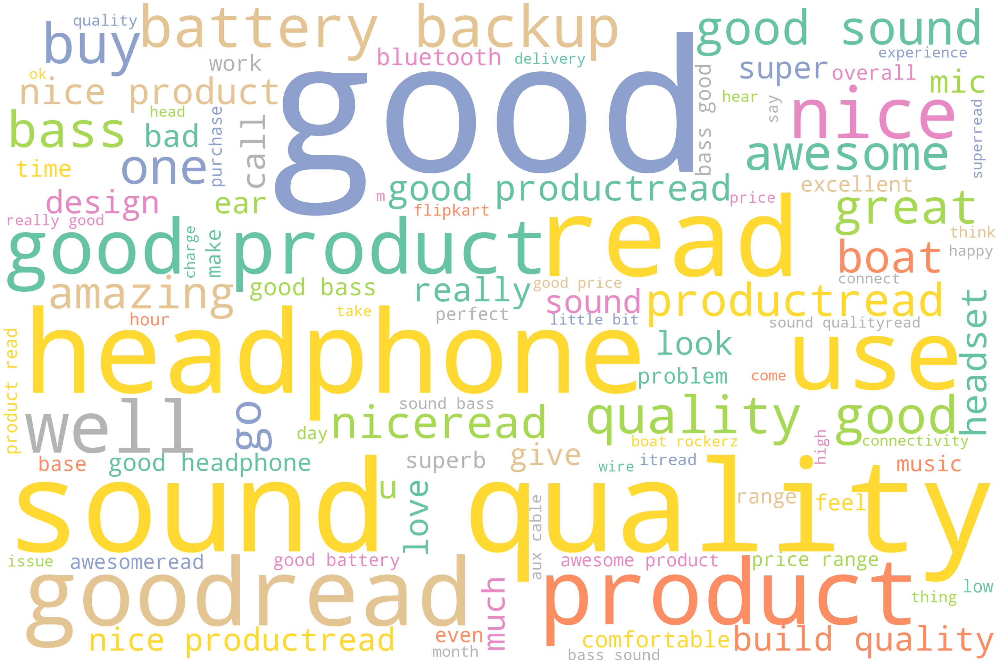

In [28]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)

# Named Entity Recognition (NER)

In [29]:
# Parts of speech (POS) tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

# Classifing Grammmer

In [30]:
for token in doc_block[100:200]:
    print(token,token.pos_)

useful ADJ
helpful ADJ
overall ADJ
bass NOUN
sound NOUN
quality NOUN
pretty ADV
good ADJ
another DET
thing NOUN
give VERB
sigh ADJ
relief NOUN
provide ADJ
wire NOUN
help NOUN
case NOUN
lack VERB
chargesread NOUN
more ADV
awesome ADJ
bass NOUN
sound NOUN
quality NOUN
good ADJ
bettary ADJ
long ADJ
life NOUN
purchase NOUN
rs999 PROPN
really ADV
grateful ADJ
product NOUN
do AUX
not PART
forget VERB
likeread ADJ
more ADV
awsome ADJ
sound NOUN
powerful ADJ
bass NOUN
battery NOUN
backup NOUN
also ADV
excellent ADJ
love NOUN
bass NOUN
I PRON
m VERB
huge ADJ
lover PROPN
music NOUN
bass NOUN
design NOUN
build NOUN
also ADV
niceand NOUN
first ADJ
time NOUN
buy VERB
headphone PROPN
electronics PROPN
item NOUN
glad ADJ
say VERB
first ADJ
time NOUN
love VERB
😍 PROPN
😍 PROPN
😍 NOUN
excellent ADJ
product NOUN
thank NOUN
boat NOUN
make VERB
nice ADJ
product NOUN
keep VERB
make VERB
thank VERB
flipkart ADJ
team NOUN
deliver VERB
nice ADJ
product NOUN
risk NOUN
lifread VERB
more ADV
this DET
product NOUN

In [ ]:
# Filtering the nouns and verbs only

In [31]:
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['sound', 'bass', 'product', 'money', 'guy', 'daut', 'productread', 'buy', 'quality', 'build', 'quality', 'awesome2', 'bluetooth', 'connectivity', 'average3', 'bass', 'battery', 'backup', 'good5', 'use', 'wire', 'charge', 'goodcron1', 'use', 'feel', 'pain', 'need', 'ear', 'price', 'go', 'pul', 'opinionif', 'want', 'quality', 'bass', 'wireless', 'headread', 'want', 'talk', 'sound', 'quality', 'sound', 'quality', 'price', 'segment', 'bass', 'punchy', 'volume', 'sound', 'crack', 'bit', 'build', 'quality', 'build', 'quality', 'get', 'headphone', 'light', 'make', 'quality', 'plastic', 'thing', 'like', 'bit', 'become', 'look', 'power', 'bassread', 'headphone', 'bass', 'fix', 'provide', 'work', 'bluetoothwire', 'alsoread', 'look', 'weight', 'sound', 'design', 'couf', 'quality', 'minute', 'feel', 'pain', 'ear', 'sweat', 'quality', 'base', 'value', 'money', 'price', 'range', 'thank', 'call', 'feature', 'poorread', 'use', 'headphone', 'month', 'bass']


In [32]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,product,2684
1,quality,2483
2,sound,1975
3,bass,1513
4,headphone,1439
5,use,1274
6,read,1260
7,battery,945
8,ear,854
9,buy,852


# Visualizing results

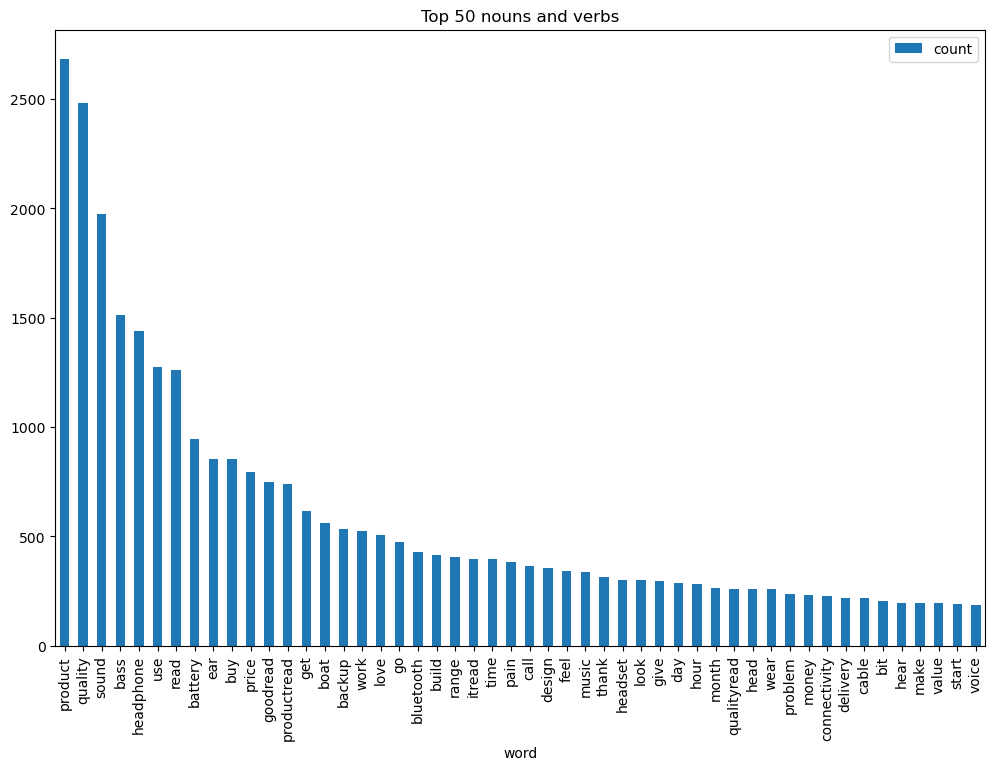

In [33]:
wd_df[0:50].plot.bar(x='word',figsize=(12,8),title='Top 50 nouns and verbs');

# Emotion Mining - Sentiment Analysis

In [34]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['It was nice produt.',
 "I like it's design a lot.",
 "It's easy to carry.",
 'And.',
 'Looked stylish.READ MORE awesome sound....very pretty to see this nd the sound quality was too good I wish to take this product loved this product 😍😍😍READ MORE awesome sound quality.',
 'pros 7-8 hrs of battery life (including 45 mins approx call time)Awesome sound output.',
 'Bass and treble are really very clear without equaliser.',
 'With equaliser, sound wary depends on the handset sound quality.Weightless to carry and in head tooMic is good, but in traffic it is not too good (3.25/5)3.5mm Option is really important to mention.',
 'Really expecting other leading brands to implement this.ConsVery tight in ears.',
 'adjusters are ok .. this ll be very tight...READ MORE I think it is such a good product not only as per the quality but also the design is quite good .',
 'I m using this product from January ...',
 'In this pandamic situation it has became the most useful and helpful .',
 "Overall th

In [35]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,It was nice produt.
1,I like it's design a lot.
2,It's easy to carry.
3,And.
4,Looked stylish.READ MORE awesome sound....very...
...,...
5139,"Build is ok, little tight on my ear, but I am ..."
5140,(I would need to replace this headphone)2. can...
5141,charging cable is too short (~ 1...READ MORE T...
5142,The sound quality is too awesome and the bass ...


# Emotion Lexicon - Affin

In [36]:
affin=pd.read_csv(r"C:\Users\Abhijit Kharade\Downloads\NLP\Afinn.csv",sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [37]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [38]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [ ]:
# manual testing

In [40]:
calculate_sentiment(text='bad sound')

-3

In [41]:
# Calculating sentiment value for each sentence
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0        3
1        2
2        1
3        0
4       16
        ..
5139    -6
5140     0
5141     4
5142     6
5143    26
Name: sentiment_value, Length: 5144, dtype: int64

In [42]:
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0         4
1         6
2         4
3         1
4        30
       ... 
5139     48
5140     30
5141     65
5142     14
5143    100
Name: word_count, Length: 5144, dtype: int64

In [43]:
sent_df.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
2654,It's cancel a decent amount of outside noise.R...,-7,110
3702,Worst experience......it's not even included i...,-6,13
4494,Believe me don't worry they will not give you ...,-6,14
5139,"Build is ok, little tight on my ear, but I am ...",-6,48
2817,999/-READ MORE averageREAD MORE ear pain.....R...,-6,57
...,...,...,...
4913,Very good.READ MORE This is the awesome prodec...,102,215
4545,Rest is goodREAD MORE It's best but sometimes ...,105,311
3160,Product I love 🤩 this Thanks FlipkartREAD MORE...,112,319
3384,You will feel the real happiness when you get ...,126,434


In [ ]:
# negative sentiment score of the whole review

In [44]:
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
3,And.,0,1
5,pros 7-8 hrs of battery life (including 45 min...,0,14
8,Really expecting other leading brands to imple...,0,11
10,I m using this product from January ...,0,8
16,Sound quality and build quality is awesome2.,0,7
...,...,...,...
5129,.thank flipcart.,0,2
5133,Quite Happy with the Flipkart Service..,0,6
5137,Bought it for my son.,0,5
5139,"Build is ok, little tight on my ear, but I am ...",-6,48


In [ ]:
# positive sentiment score of the whole review

In [45]:
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
0,It was nice produt.,3,4
1,I like it's design a lot.,2,6
2,It's easy to carry.,1,4
4,Looked stylish.READ MORE awesome sound....very...,16,30
6,Bass and treble are really very clear without ...,1,9
...,...,...,...
5136,Lucky to have it at reasonable rate .READ MORE...,1,42
5138,He is happy.READ MORE The product delivered on...,8,26
5141,charging cable is too short (~ 1...READ MORE T...,4,65
5142,The sound quality is too awesome and the bass ...,6,14


In [46]:
# Adding index cloumn
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,It was nice produt.,3,4,0
1,I like it's design a lot.,2,6,1
2,It's easy to carry.,1,4,2
3,And.,0,1,3
4,Looked stylish.READ MORE awesome sound....very...,16,30,4
...,...,...,...,...
5139,"Build is ok, little tight on my ear, but I am ...",-6,48,5139
5140,(I would need to replace this headphone)2. can...,0,30,5140
5141,charging cable is too short (~ 1...READ MORE T...,4,65,5141
5142,The sound quality is too awesome and the bass ...,6,14,5142


C:\Users\Abhijit Kharade\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sentiment_value', ylabel='Density'>

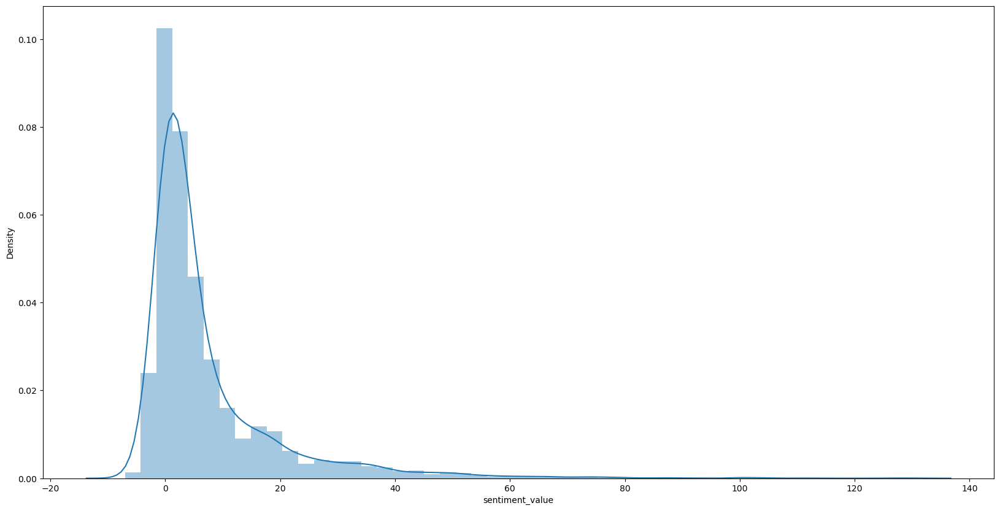

In [48]:
# Plotting the sentiment value
import seaborn as sns
plt.figure(figsize=(20,10))
sns.distplot(sent_df['sentiment_value'])

<AxesSubplot:xlabel='index', ylabel='sentiment_value'>

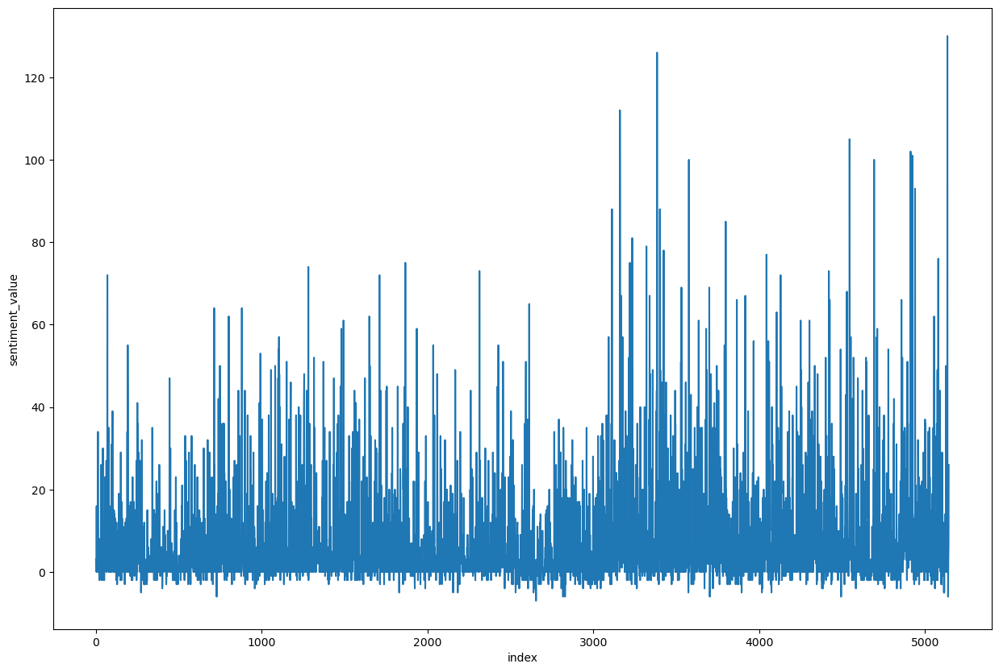

In [49]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)